### Essential Libraries
Import the essential Python libraries.

NumPy : Library for Numeric Computations in Python

Pandas : Library for Data Acquisition and Preparation

Matplotlib : Low-level library for Data Visualization

Seaborn : Higher-level library for Data Visualization

In [420]:
# Basic Libraries
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt # we only need pyplot
sb.set() # set the default Seaborn style for graphics


import re
import plotly.figure_factory as ff
import plotly.express as px

In [421]:
df = pd.read_csv('steam_cleaned.csv')
df

,appid,name,achievements,average_playtime,median_playtime,owners,price,categories_Multi-player,categories_Online Multi-Player,categories_Local Multi-Player,...,genres_Software Training,genres_Sexual Content,genres_Audio Production,genres_Game Development,genres_Photo Editing,genres_Accounting,genres_Documentary,genres_Tutorial,age,positive_ratio
0,10,Counter-Strike,0,17612,317,15000000,7.19,1,1,1,...,0,0,0,0,0,0,0,0,8461,0.973888
1,20,Team Fortress Classic,0,277,62,7500000,3.99,1,1,1,...,0,0,0,0,0,0,0,0,9041,0.839787
2,30,Day of Defeat,0,187,34,7500000,3.99,1,0,0,...,0,0,0,0,0,0,0,0,7550,0.895648
3,40,Deathmatch Classic,0,258,184,7500000,3.99,1,1,1,...,0,0,0,0,0,0,0,0,8249,0.826623
4,50,Half-Life: Opposing Force,0,624,415,7500000,3.99,1,0,0,...,0,0,0,0,0,0,0,0,8827,0.947996
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15283,1057180,Border Officer,12,0,0,10000,7.19,0,0,0,...,0,0,0,0,0,0,0,0,1721,0.714286
15284,1057430,Geometry May. I swear it's a nice free game,7,0,0,10000,0.00,0,0,0,...,0,0,0,0,0,0,0,0,1721,0.846939
15285,1057690,Sin Slayers: The First Sin,0,0,0,35000,0.00,0,0,0,...,0,0,0,0,0,0,0,0,1726,0.776923
15286,1058430,A Legionary's Life,23,0,0,10000,6.10,0,0,0,...,0,0,0,0,0,0,0,0,1718,0.733333


Our question is : is single or multiplayer game more popular ?

We are using steamspytag to predict average_playtime.

In [422]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15288 entries, 0 to 15287
Columns: 406 entries, appid to positive_ratio
dtypes: float64(2), int64(403), object(1)
memory usage: 47.4+ MB


#Drop the unnamed first column which was added automatically during export of cleaned data file.

In [423]:
#df = df.drop(df.columns[0], axis=1)

In [424]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15288 entries, 0 to 15287
Columns: 406 entries, appid to positive_ratio
dtypes: float64(2), int64(403), object(1)
memory usage: 47.4+ MB


In [425]:
for col in df:
    print(col, ":", df[col].nunique())

appid : 15288
name : 15277
achievements : 365
average_playtime : 1333
median_playtime : 1299
owners : 13
price : 221
categories_Multi-player : 2
categories_Online Multi-Player : 2
categories_Local Multi-Player : 2
categories_Valve Anti-Cheat enabled : 2
categories_Single-player : 2
categories_Steam Cloud : 2
categories_Steam Achievements : 2
categories_Steam Trading Cards : 2
categories_Captions available : 2
categories_Partial Controller Support : 2
categories_Includes Source SDK : 2
categories_Cross-Platform Multiplayer : 2
categories_Stats : 2
categories_Commentary available : 2
categories_Includes level editor : 2
categories_Steam Workshop : 2
categories_In-App Purchases : 2
categories_Co-op : 2
categories_Full controller support : 2
categories_Steam Leaderboards : 2
categories_SteamVR Collectibles : 2
categories_Online Co-op : 2
categories_Shared/Split Screen : 2
categories_Local Co-op : 2
categories_MMO : 2
categories_VR Support : 2
categories_Mods : 2
categories_Mods (require HL

### Categories

In [426]:
category_columns = ['categories_Multi-player', 'categories_Online Multi-Player', 'categories_Local Multi-Player', 'categories_Valve Anti-Cheat enabled',
                        'categories_Single-player', 'categories_Steam Cloud', 'categories_Steam Achievements', 'categories_Steam Trading Cards',
                        'categories_Captions available', 'categories_Partial Controller Support', 'categories_Includes Source SDK',
                        'categories_Cross-Platform Multiplayer', 'categories_Stats', 'categories_Commentary available',
                        'categories_Includes level editor', 'categories_Steam Workshop', 'categories_In-App Purchases',
                        'categories_Co-op', 'categories_Full controller support', 'categories_Steam Leaderboards',
                        'categories_SteamVR Collectibles', 'categories_Online Co-op', 'categories_Shared/Split Screen',
                        'categories_Local Co-op', 'categories_MMO', 'categories_VR Support',
                        'categories_Mods', 'categories_Mods (require HL2)', 'categories_Steam Turn Notifications']

cat_col_names = []

for col in sorted(category_columns):
    col_name = re.sub(r'[\s\-\/]', '_', col.lower())
    col_name = re.sub(r'[()]', '', col_name)
    cat_col_names.append(col_name)

#cat_counts = df[cat_col_names].sum()

In [427]:
eda_df = pd.DataFrame(zip(df['categories_Multi-player'], df['categories_Online Multi-Player'], df['categories_Local Multi-Player'], df['categories_Valve Anti-Cheat enabled'],
                        df['categories_Single-player'], df['categories_Steam Cloud'], df['categories_Steam Achievements'], df['categories_Steam Trading Cards'],
                        df['categories_Captions available'], df['categories_Partial Controller Support'], df['categories_Includes Source SDK'],
                        df['categories_Cross-Platform Multiplayer'], df['categories_Stats'], df['categories_Commentary available'],
                        df['categories_Includes level editor'], df['categories_Steam Workshop'], df['categories_In-App Purchases'],
                        df['categories_Co-op'], df['categories_Full controller support'], df['categories_Steam Leaderboards'],
                        df['categories_SteamVR Collectibles'], df['categories_Online Co-op'], df['categories_Shared/Split Screen'],
                        df['categories_Local Co-op'], df['categories_MMO'], df['categories_VR Support'],
                        df['categories_Mods'], df['categories_Mods (require HL2)'], df['categories_Steam Turn Notifications']
                         ),
                      columns=['Multi-player', 'Online Multi-Player', 'Local Multi-Player', 'Valve Anti-Cheat enabled',
                        'Single-player', 'Steam Cloud', 'Steam Achievements', 'Steam Trading Cards',
                        'Captions available', 'Partial Controller Support', 'Includes Source SDK',
                        'Cross-Platform Multiplayer', 'Stats', 'Commentary available',
                        'Includes level editor', 'Steam Workshop', 'In-App Purchases',
                        'Co-op', 'Full controller support', 'Steam Leaderboards',
                        'SteamVR Collectibles', 'Online Co-op', 'Shared/Split Screen',
                        'Local Co-op', 'MMO', 'VR Support',
                        'Mods', 'Mods (require HL2)', 'Steam Turn Notifications'])

In [428]:
eda_df

,Multi-player,Online Multi-Player,Local Multi-Player,Valve Anti-Cheat enabled,Single-player,Steam Cloud,Steam Achievements,Steam Trading Cards,Captions available,Partial Controller Support,...,Steam Leaderboards,SteamVR Collectibles,Online Co-op,Shared/Split Screen,Local Co-op,MMO,VR Support,Mods,Mods (require HL2),Steam Turn Notifications
0,1,1,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,1,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,1,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15283,0,0,0,0,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
15284,0,0,0,0,1,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
15285,0,0,0,0,1,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
15286,0,0,0,0,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [429]:
dfCorr = eda_df.corr()
fig = ff.create_annotated_heatmap(
    z=dfCorr.values,
    x=list(dfCorr.columns),
    y=list(dfCorr.index),
    colorscale=px.colors.diverging.RdBu,
    annotation_text=dfCorr.round(2).values,
    showscale=True, reversescale=True)

for i in range(len(fig.layout.annotations)):
    fig.layout.annotations[i].font.size = 8

#plt.rcParams['figure.figsize'] = [100, 30]
fig.show()

We try to analyze the correlation between the categories to see if any relations between them. e don't use categories as a variable because the correlation between them is bad. So we cannot find any way to cluster the categories together.

Instead we will be looking at steamspy tags.

### Box plot of categories and genres against average playtime

Create a duplicate dataframe to work on this section.

In [430]:
boxplotDF = df.copy()

Check the univariate distribution of average_playtime.

<Axes: >

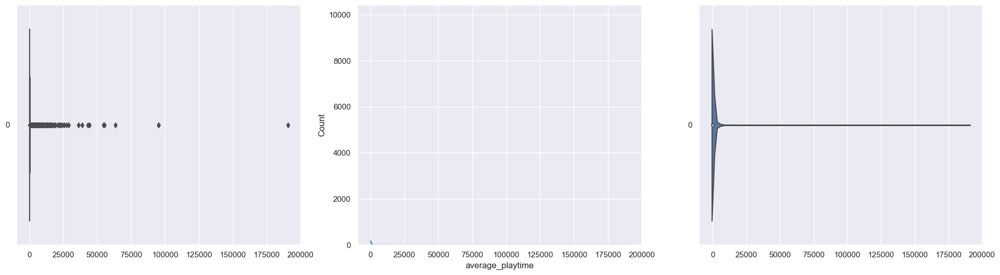

In [431]:
f, axes = plt.subplots(1, 3, figsize=(24, 6))

sb.boxplot(data = boxplotDF['average_playtime'], orient = "h", ax = axes[0])
sb.histplot(data = boxplotDF['average_playtime'], kde = True, ax = axes[1])
sb.violinplot(data = boxplotDF['average_playtime'], orient = "h", ax = axes[2])

In [432]:
Q1 = boxplotDF['average_playtime'].quantile(0.25)
Q3 = boxplotDF['average_playtime'].quantile(0.75)
IQR = Q3 - Q1

outliers = ((boxplotDF['average_playtime'] < (Q1 - (1.5 * IQR))) | (boxplotDF['average_playtime'] > (Q3 + (1.5 * IQR))))

# count no. of outliers
outliers.sum()

1506

In [433]:
def remove_outliers(df):
    Q1 = df['average_playtime'].quantile(0.25)
    Q3 = df['average_playtime'].quantile(0.75)
    IQR = Q3 - Q1
    df_no_outliers = df[(df['average_playtime'] > Q1 - (1.5 * IQR)) & (df['average_playtime'] < Q3 + (1.5 * IQR))]
    return df_no_outliers

In [434]:
boxplotDF = remove_outliers(boxplotDF)
boxplotDF

,appid,name,achievements,average_playtime,median_playtime,owners,price,categories_Multi-player,categories_Online Multi-Player,categories_Local Multi-Player,...,genres_Software Training,genres_Sexual Content,genres_Audio Production,genres_Game Development,genres_Photo Editing,genres_Accounting,genres_Documentary,genres_Tutorial,age,positive_ratio
1,20,Team Fortress Classic,0,277,62,7500000,3.99,1,1,1,...,0,0,0,0,0,0,0,0,9041,0.839787
2,30,Day of Defeat,0,187,34,7500000,3.99,1,0,0,...,0,0,0,0,0,0,0,0,7550,0.895648
3,40,Deathmatch Classic,0,258,184,7500000,3.99,1,1,1,...,0,0,0,0,0,0,0,0,8249,0.826623
5,60,Ricochet,0,175,10,7500000,3.99,1,1,0,...,0,0,0,0,0,0,0,0,8461,0.801278
8,130,Half-Life: Blue Shift,0,361,205,7500000,3.99,0,0,0,...,0,0,0,0,0,0,0,0,8249,0.900990
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15283,1057180,Border Officer,12,0,0,10000,7.19,0,0,0,...,0,0,0,0,0,0,0,0,1721,0.714286
15284,1057430,Geometry May. I swear it's a nice free game,7,0,0,10000,0.00,0,0,0,...,0,0,0,0,0,0,0,0,1721,0.846939
15285,1057690,Sin Slayers: The First Sin,0,0,0,35000,0.00,0,0,0,...,0,0,0,0,0,0,0,0,1726,0.776923
15286,1058430,A Legionary's Life,23,0,0,10000,6.10,0,0,0,...,0,0,0,0,0,0,0,0,1718,0.733333


Even after removal of outliers, most games seem to be 0 hours of playtime. This is not conducive to our data analysis. We will remove games with 0 hours of playtime, to focus on more tangible aspects that have some significance for our analysis.

In [435]:
boxplotDF = boxplotDF[(boxplotDF['average_playtime'] != 0)]
boxplotDF

,appid,name,achievements,average_playtime,median_playtime,owners,price,categories_Multi-player,categories_Online Multi-Player,categories_Local Multi-Player,...,genres_Software Training,genres_Sexual Content,genres_Audio Production,genres_Game Development,genres_Photo Editing,genres_Accounting,genres_Documentary,genres_Tutorial,age,positive_ratio
1,20,Team Fortress Classic,0,277,62,7500000,3.99,1,1,1,...,0,0,0,0,0,0,0,0,9041,0.839787
2,30,Day of Defeat,0,187,34,7500000,3.99,1,0,0,...,0,0,0,0,0,0,0,0,7550,0.895648
3,40,Deathmatch Classic,0,258,184,7500000,3.99,1,1,1,...,0,0,0,0,0,0,0,0,8249,0.826623
5,60,Ricochet,0,175,10,7500000,3.99,1,1,0,...,0,0,0,0,0,0,0,0,8461,0.801278
8,130,Half-Life: Blue Shift,0,361,205,7500000,3.99,0,0,0,...,0,0,0,0,0,0,0,0,8249,0.900990
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15212,1020340,Audica,0,17,17,10000,15.49,0,0,0,...,0,0,0,0,0,0,0,0,1761,0.795181
15215,1020820,KumaKuma Manga Editor,14,43,43,35000,4.79,0,0,0,...,0,0,0,0,0,0,0,0,1769,0.894057
15244,1031480,東方幕華祭 春雪篇 ～ Fantastic Danmaku Festival Part II,27,154,154,10000,10.29,0,0,0,...,0,0,0,0,0,0,0,0,1750,0.970219
15261,1043180,Lovers of Aether,15,12,12,75000,0.00,0,0,0,...,0,0,0,0,0,0,0,0,1736,0.957353


In [436]:
'''f, axes = plt.subplots(1, 3, figsize=(24, 6))

sb.boxplot(data = boxplotDF['average_playtime'], orient = "h", ax = axes[0])
sb.histplot(data = boxplotDF['average_playtime'], kde = True, ax = axes[1])
sb.violinplot(data = boxplotDF['average_playtime'], orient = "h", ax = axes[2])'''

'f, axes = plt.subplots(1, 3, figsize=(24, 6))\n\nsb.boxplot(data = boxplotDF[\'average_playtime\'], orient = "h", ax = axes[0])\nsb.histplot(data = boxplotDF[\'average_playtime\'], kde = True, ax = axes[1])\nsb.violinplot(data = boxplotDF[\'average_playtime\'], orient = "h", ax = axes[2])'

In [437]:
catDF = pd.DataFrame(boxplotDF[['categories_Multi-player', 'categories_Online Multi-Player', 'categories_Local Multi-Player', 'categories_Valve Anti-Cheat enabled',
                        'categories_Single-player', 'categories_Steam Cloud', 'categories_Steam Achievements', 'categories_Steam Trading Cards',
                        'categories_Captions available', 'categories_Partial Controller Support', 'categories_Includes Source SDK',
                        'categories_Cross-Platform Multiplayer', 'categories_Stats', 'categories_Commentary available',
                        'categories_Includes level editor', 'categories_Steam Workshop', 'categories_In-App Purchases',
                        'categories_Co-op', 'categories_Full controller support', 'categories_Steam Leaderboards',
                        'categories_SteamVR Collectibles', 'categories_Online Co-op', 'categories_Shared/Split Screen',
                        'categories_Local Co-op', 'categories_MMO', 'categories_VR Support',
                        'categories_Mods', 'categories_Mods (require HL2)', 'categories_Steam Turn Notifications']])
catDF

,categories_Multi-player,categories_Online Multi-Player,categories_Local Multi-Player,categories_Valve Anti-Cheat enabled,categories_Single-player,categories_Steam Cloud,categories_Steam Achievements,categories_Steam Trading Cards,categories_Captions available,categories_Partial Controller Support,...,categories_Steam Leaderboards,categories_SteamVR Collectibles,categories_Online Co-op,categories_Shared/Split Screen,categories_Local Co-op,categories_MMO,categories_VR Support,categories_Mods,categories_Mods (require HL2),categories_Steam Turn Notifications
1,1,1,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,1,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,1,1,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15212,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
15215,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
15244,0,0,0,0,1,1,1,0,0,1,...,0,0,0,0,0,0,0,0,0,0
15261,0,0,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [438]:
# Add avg playtime to the categories dataframe
catDF = pd.concat([catDF, boxplotDF['average_playtime']], axis = 1).reindex(catDF.index)
catDF

,categories_Multi-player,categories_Online Multi-Player,categories_Local Multi-Player,categories_Valve Anti-Cheat enabled,categories_Single-player,categories_Steam Cloud,categories_Steam Achievements,categories_Steam Trading Cards,categories_Captions available,categories_Partial Controller Support,...,categories_SteamVR Collectibles,categories_Online Co-op,categories_Shared/Split Screen,categories_Local Co-op,categories_MMO,categories_VR Support,categories_Mods,categories_Mods (require HL2),categories_Steam Turn Notifications,average_playtime
1,1,1,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,277
2,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,187
3,1,1,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,258
5,1,1,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,175
8,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,361
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15212,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,17
15215,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,43
15244,0,0,0,0,1,1,1,0,0,1,...,0,0,0,0,0,0,0,0,0,154
15261,0,0,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,12


Check the distribution of within each category (1=yes, 0=no).

In [439]:
for var in catDF:
    print(catDF[var].value_counts(normalize=True), "\n")

categories_Multi-player
0    0.792384
1    0.207616
Name: proportion, dtype: float64 

categories_Online Multi-Player
0    0.897552
1    0.102448
Name: proportion, dtype: float64 

categories_Local Multi-Player
0    0.955802
1    0.044198
Name: proportion, dtype: float64 

categories_Valve Anti-Cheat enabled
0    0.992294
1    0.007706
Name: proportion, dtype: float64 

categories_Single-player
1    0.93563
0    0.06437
Name: proportion, dtype: float64 

categories_Steam Cloud
0    0.63282
1    0.36718
Name: proportion, dtype: float64 

categories_Steam Achievements
1    0.623753
0    0.376247
Name: proportion, dtype: float64 

categories_Steam Trading Cards
1    0.612194
0    0.387806
Name: proportion, dtype: float64 

categories_Captions available
0    0.966002
1    0.033998
Name: proportion, dtype: float64 

categories_Partial Controller Support
0    0.822076
1    0.177924
Name: proportion, dtype: float64 

categories_Includes Source SDK
0    0.997053
1    0.002947
Name: proportion,

In [440]:
catDF

,categories_Multi-player,categories_Online Multi-Player,categories_Local Multi-Player,categories_Valve Anti-Cheat enabled,categories_Single-player,categories_Steam Cloud,categories_Steam Achievements,categories_Steam Trading Cards,categories_Captions available,categories_Partial Controller Support,...,categories_SteamVR Collectibles,categories_Online Co-op,categories_Shared/Split Screen,categories_Local Co-op,categories_MMO,categories_VR Support,categories_Mods,categories_Mods (require HL2),categories_Steam Turn Notifications,average_playtime
1,1,1,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,277
2,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,187
3,1,1,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,258
5,1,1,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,175
8,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,361
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15212,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,17
15215,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,43
15244,0,0,0,0,1,1,1,0,0,1,...,0,0,0,0,0,0,0,0,0,154
15261,0,0,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,12


Some categories are almost fully skewed towards almost all games (1) or almost no games (0) are in the category. We will use the categories that are not so heavily skewed (ie. at most 95% of the games in either 1 or 0). 

In [441]:
catDF = catDF.drop(columns=["categories_Local Multi-Player", "categories_Valve Anti-Cheat enabled", "categories_Captions available",
                           "categories_Includes Source SDK", "categories_Commentary available", "categories_Steam Workshop",
                           "categories_In-App Purchases", "categories_SteamVR Collectibles", "categories_Local Co-op", "categories_MMO",
                           "categories_VR Support", "categories_Mods", "categories_Mods (require HL2)", "categories_Steam Turn Notifications"])

catDF

,categories_Multi-player,categories_Online Multi-Player,categories_Single-player,categories_Steam Cloud,categories_Steam Achievements,categories_Steam Trading Cards,categories_Partial Controller Support,categories_Cross-Platform Multiplayer,categories_Stats,categories_Includes level editor,categories_Co-op,categories_Full controller support,categories_Steam Leaderboards,categories_Online Co-op,categories_Shared/Split Screen,average_playtime
1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,277
2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,187
3,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,258
5,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,175
8,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,361
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15212,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,17
15215,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,43
15244,0,0,1,1,1,0,1,0,0,0,0,0,0,0,0,154
15261,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,12


Now we plot the box plot of each category against the average playtime.

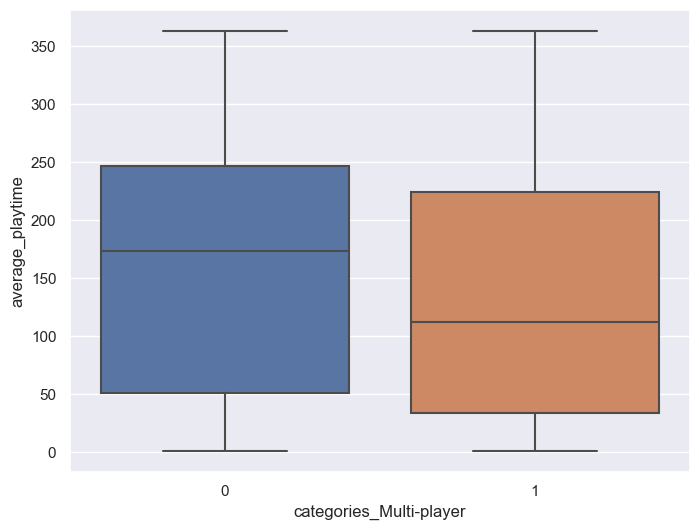

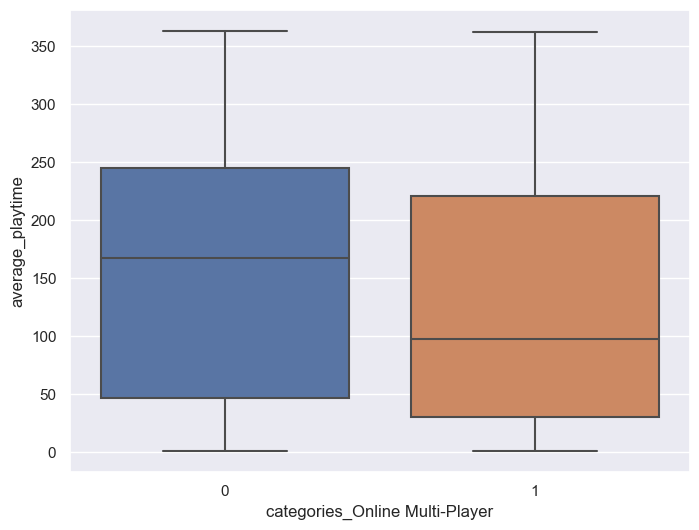

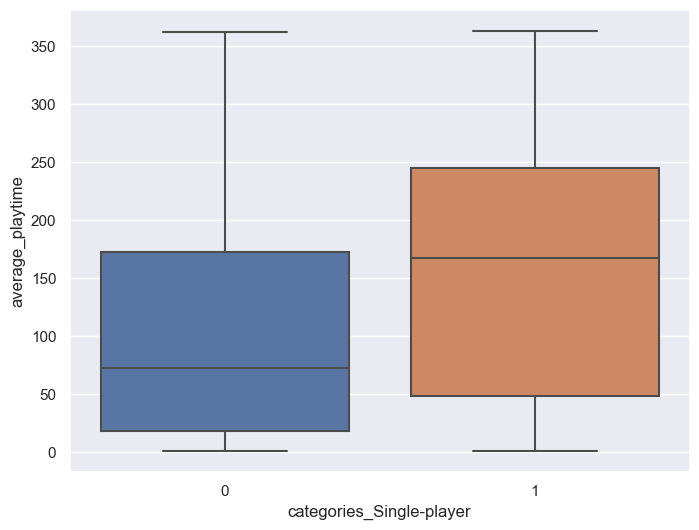

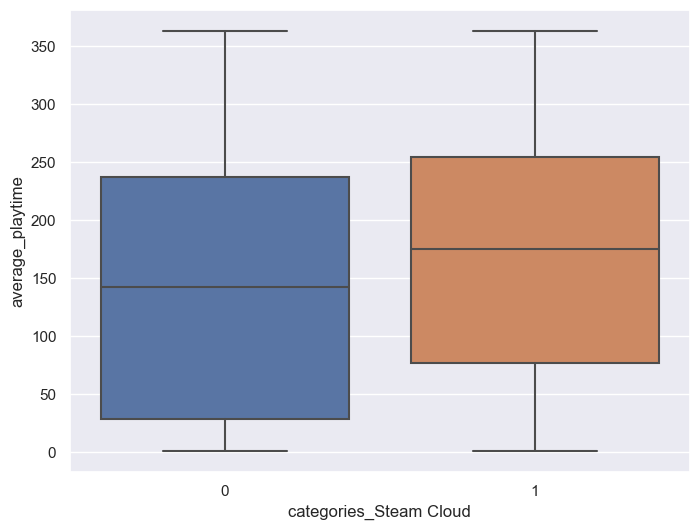

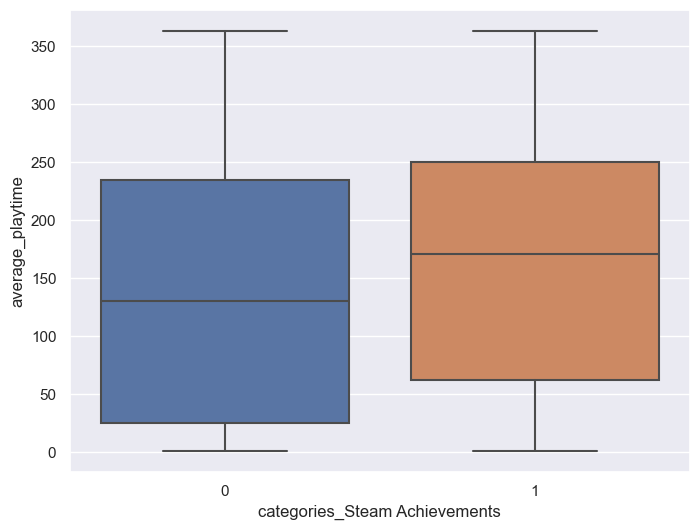

...

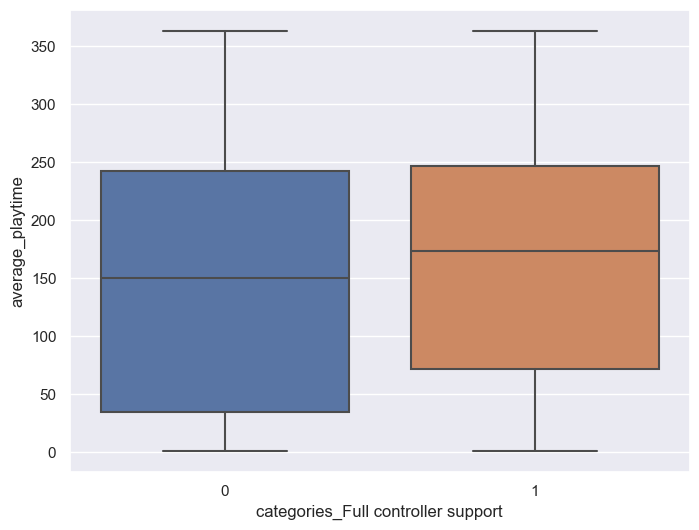

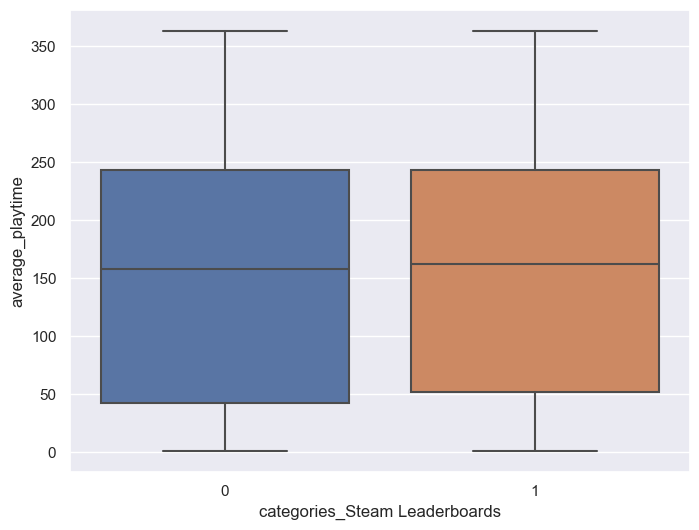

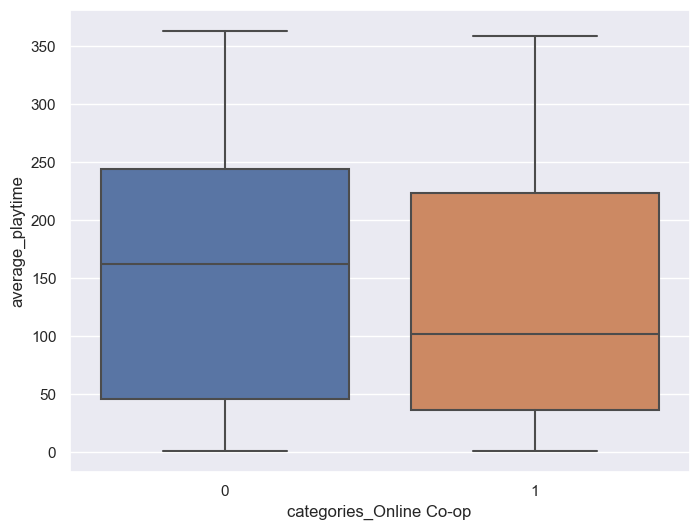

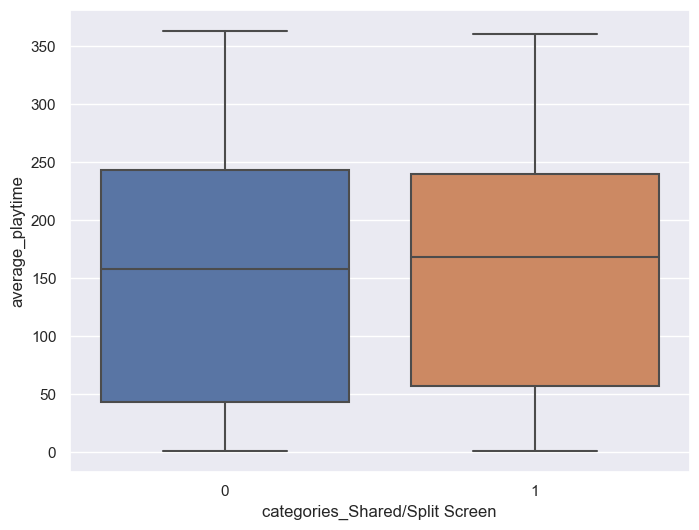

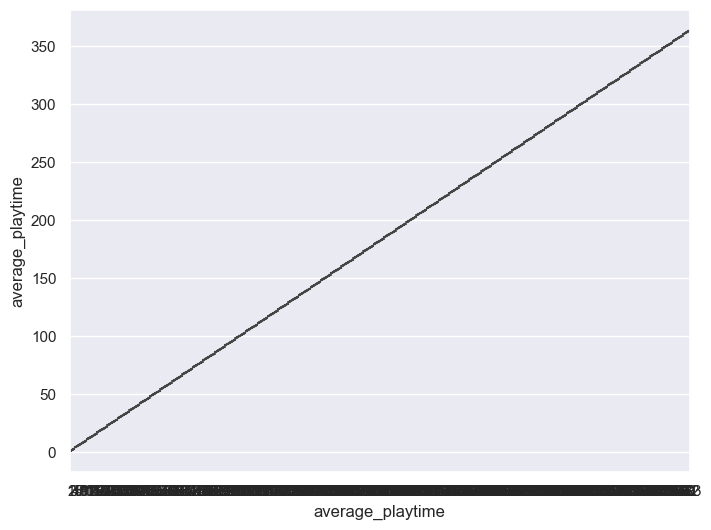

In [442]:
for var in catDF:
    # Box-plot of each categories against average playtime
    f = plt.figure(figsize=(8, 6))
    sb.boxplot(x = var, y = 'average_playtime', data = catDF)

In [443]:
genreDF = pd.DataFrame(boxplotDF[['genres_Action', 'genres_Free to Play', 'genres_Strategy', 'genres_Adventure', 
                           'genres_Indie', 'genres_RPG', 'genres_Animation & Modeling', 'genres_Video Production', 'genres_Casual', 'genres_Simulation', 'genres_Racing', 
                           'genres_Violent', 'genres_Massively Multiplayer', 'genres_Nudity', 'genres_Sports', 
                           'genres_Early Access', 'genres_Gore', 'genres_Utilities', 'genres_Design & Illustration', 
                           'genres_Web Publishing', 'genres_Education', 'genres_Software Training', 'genres_Sexual Content', 
                           'genres_Audio Production', 'genres_Game Development', 'genres_Photo Editing', 'genres_Accounting', 'genres_Documentary', 'genres_Tutorial'
                          ]])
genreDF

,genres_Action,genres_Free to Play,genres_Strategy,genres_Adventure,genres_Indie,genres_RPG,genres_Animation & Modeling,genres_Video Production,genres_Casual,genres_Simulation,...,genres_Web Publishing,genres_Education,genres_Software Training,genres_Sexual Content,genres_Audio Production,genres_Game Development,genres_Photo Editing,genres_Accounting,genres_Documentary,genres_Tutorial
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15212,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
15215,0,0,0,0,0,0,1,0,0,0,...,1,0,0,0,0,0,0,0,0,0
15244,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
15261,0,0,0,0,1,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0


In [444]:
# Add avg playtime to the genres dataframe
genreDF = pd.concat([genreDF, boxplotDF['average_playtime']], axis = 1).reindex(genreDF.index)
genreDF

,genres_Action,genres_Free to Play,genres_Strategy,genres_Adventure,genres_Indie,genres_RPG,genres_Animation & Modeling,genres_Video Production,genres_Casual,genres_Simulation,...,genres_Education,genres_Software Training,genres_Sexual Content,genres_Audio Production,genres_Game Development,genres_Photo Editing,genres_Accounting,genres_Documentary,genres_Tutorial,average_playtime
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,277
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,187
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,258
5,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,175
8,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,361
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15212,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,17
15215,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,43
15244,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,154
15261,0,0,0,0,1,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,12


Check the distribution of within each genre (1=yes, 0=no).

In [445]:
for var in genreDF:
    print(genreDF[var].value_counts(normalize=True), "\n")

genres_Action
0    0.500453
1    0.499547
Name: proportion, dtype: float64 

genres_Free to Play
0    0.886899
1    0.113101
Name: proportion, dtype: float64 

genres_Strategy
0    0.801677
1    0.198323
Name: proportion, dtype: float64 

genres_Adventure
0    0.625567
1    0.374433
Name: proportion, dtype: float64 

genres_Indie
1    0.703762
0    0.296238
Name: proportion, dtype: float64 

genres_RPG
0    0.838395
1    0.161605
Name: proportion, dtype: float64 

genres_Animation & Modeling
0    0.998413
1    0.001587
Name: proportion, dtype: float64 

genres_Video Production
0    0.999093
1    0.000907
Name: proportion, dtype: float64 

genres_Casual
0    0.68835
1    0.31165
Name: proportion, dtype: float64 

genres_Simulation
0    0.839529
1    0.160471
Name: proportion, dtype: float64 

genres_Racing
0    0.969175
1    0.030825
Name: proportion, dtype: float64 

genres_Violent
0    0.975068
1    0.024932
Name: proportion, dtype: float64 

genres_Massively Multiplayer
0    0.958296

In [446]:
genreDF

,genres_Action,genres_Free to Play,genres_Strategy,genres_Adventure,genres_Indie,genres_RPG,genres_Animation & Modeling,genres_Video Production,genres_Casual,genres_Simulation,...,genres_Education,genres_Software Training,genres_Sexual Content,genres_Audio Production,genres_Game Development,genres_Photo Editing,genres_Accounting,genres_Documentary,genres_Tutorial,average_playtime
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,277
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,187
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,258
5,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,175
8,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,361
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15212,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,17
15215,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,43
15244,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,154
15261,0,0,0,0,1,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,12


Some genres are almost fully skewed towards almost all games (1) or almost no games (0) are in the genre. We will use the genres that are not so heavily skewed (ie. at most 95% of the games in either 1 or 0). 

In [447]:
genreDF = genreDF.drop(columns=["genres_Animation & Modeling", "genres_Video Production", "genres_Racing",
                           "genres_Violent", "genres_Massively Multiplayer", "genres_Nudity",
                           "genres_Sports", "genres_Gore", "genres_Utilities", "genres_Design & Illustration",
                               "genres_Web Publishing", "genres_Education", "genres_Software Training", "genres_Sexual Content",
                               "genres_Audio Production", "genres_Game Development", "genres_Photo Editing", "genres_Accounting",
                               "genres_Documentary", "genres_Tutorial"])

genreDF

,genres_Action,genres_Free to Play,genres_Strategy,genres_Adventure,genres_Indie,genres_RPG,genres_Casual,genres_Simulation,genres_Early Access,average_playtime
1,1,0,0,0,0,0,0,0,0,277
2,1,0,0,0,0,0,0,0,0,187
3,1,0,0,0,0,0,0,0,0,258
5,1,0,0,0,0,0,0,0,0,175
8,1,0,0,0,0,0,0,0,0,361
...,...,...,...,...,...,...,...,...,...,...
15212,1,0,0,0,1,0,0,0,1,17
15215,0,0,0,0,0,0,0,0,0,43
15244,0,0,0,0,1,0,0,0,0,154
15261,0,0,0,0,1,0,1,1,0,12


Now we plot the box plot of each genre against the average playtime.

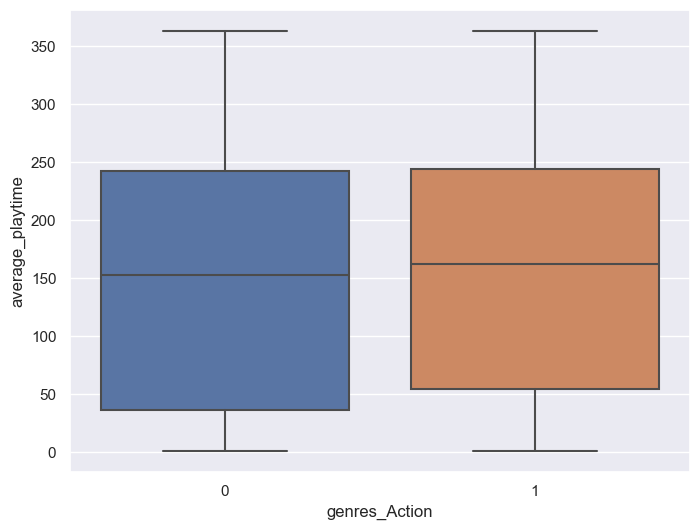

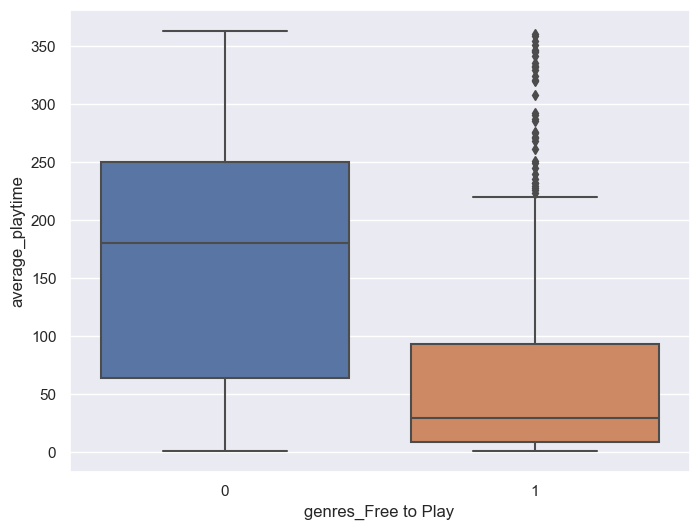

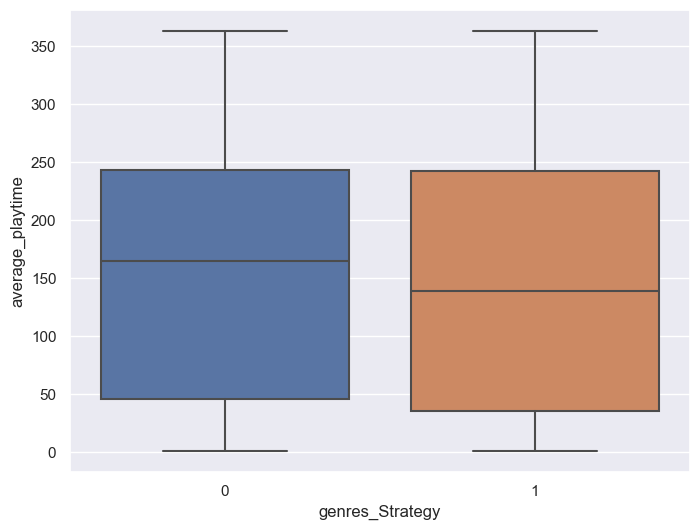

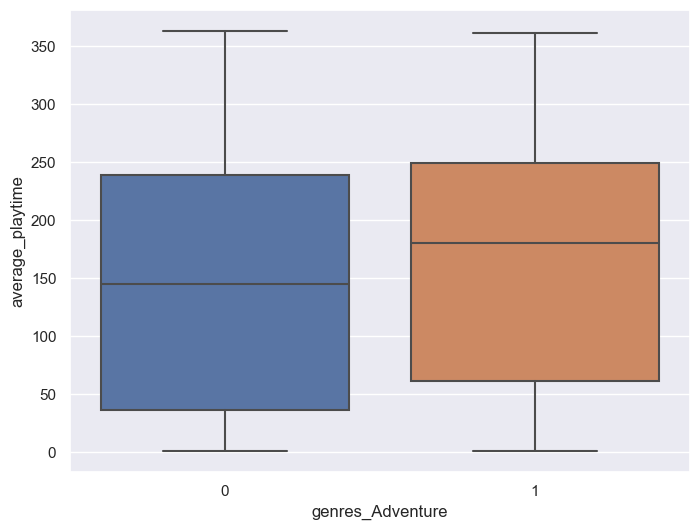

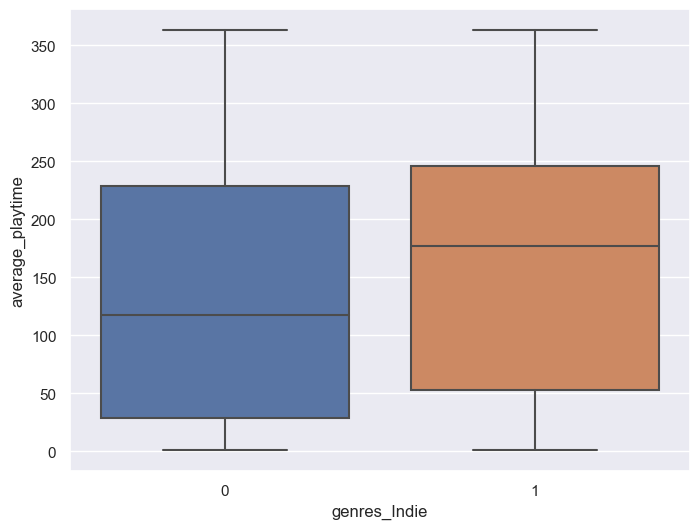

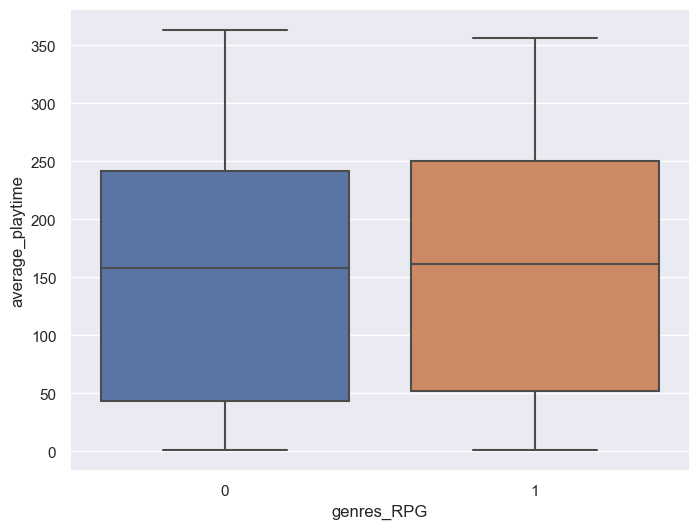

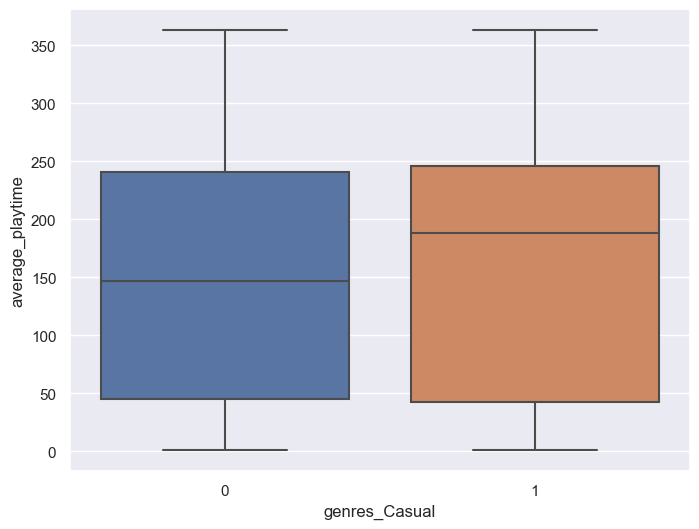

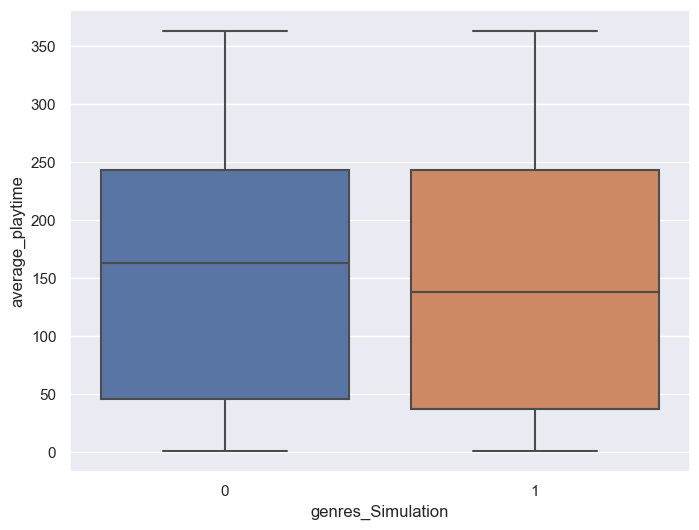

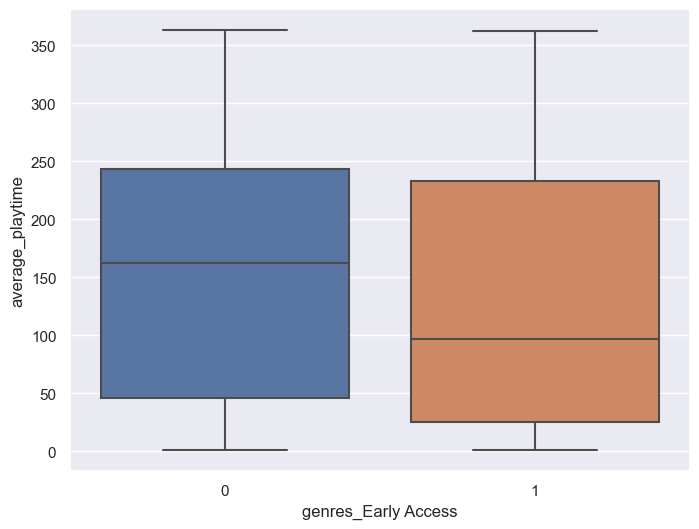

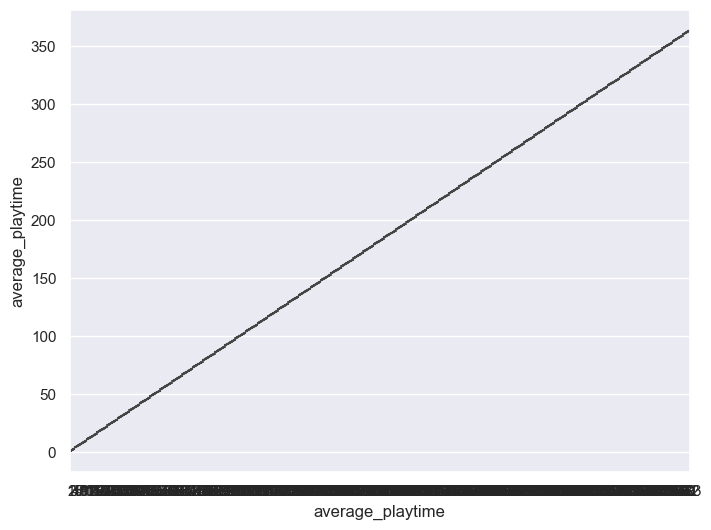

In [448]:
for var in genreDF:
    # Box-plot of each genre against average playtime
    f = plt.figure(figsize=(8, 6))
    sb.boxplot(x = var, y = 'average_playtime', data = genreDF)

In [449]:
df.shape

(15288, 406)

In [450]:
steamspy = pd.read_csv('steamspy_tag_data.csv')
steamspy

,appid,1980s,1990s,2.5d,2d,2d_fighter,360_video,3d,3d_platformer,3d_vision,...,warhammer_40k,web_publishing,werewolves,western,word_game,world_war_i,world_war_ii,wrestling,zombies,e_sports
0,10,144,564,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,550
1,20,0,71,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,30,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,5,122,0,0,0
3,40,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,50,0,77,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29017,1065230,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
29018,1065570,0,0,0,0,0,0,0,12,0,...,0,0,0,0,0,0,0,0,0,0
29019,1065650,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
29020,1066700,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


The steamspy dataframe has 29022 rows, more than the 15288 rows in the actual dataframe (df). Using the appid as primary key, compare and remove those games not in the actual dataframe.

In [451]:
steamspy = steamspy[steamspy['appid'].isin(df['appid'])]
steamspy

,appid,1980s,1990s,2.5d,2d,2d_fighter,360_video,3d,3d_platformer,3d_vision,...,warhammer_40k,web_publishing,werewolves,western,word_game,world_war_i,world_war_ii,wrestling,zombies,e_sports
0,10,144,564,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,550
1,20,0,71,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,30,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,5,122,0,0,0
3,40,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,50,0,77,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28974,1057180,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
28977,1057430,0,0,0,20,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
28981,1057690,0,0,0,11,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
28986,1058430,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Now both dataframes are equal as each has 15288 rows.

In [452]:
# Add avg playtime to the dataframe
steamspy = pd.concat([steamspy, df['average_playtime']], axis = 1).reindex(steamspy.index)
steamspy

,appid,1980s,1990s,2.5d,2d,2d_fighter,360_video,3d,3d_platformer,3d_vision,...,web_publishing,werewolves,western,word_game,world_war_i,world_war_ii,wrestling,zombies,e_sports,average_playtime
0,10.0,144.0,564.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,550.0,17612.0
1,20.0,0.0,71.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,277.0
2,30.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,5.0,122.0,0.0,0.0,0.0,187.0
3,40.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,258.0
4,50.0,0.0,77.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,624.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28974,1057180.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
28977,1057430.0,0.0,0.0,0.0,20.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
28981,1057690.0,0.0,0.0,0.0,11.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
28986,1058430.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN


Check the distribution of <s>price</s> <b><u>average playtime</u></b> across the 23 different categories using box-plots. (chanbakjsd)

In [453]:
playtimeDF = steamspy[(steamspy["average_playtime"] > 10000)]

playtimeDF

,appid,1980s,1990s,2.5d,2d,2d_fighter,360_video,3d,3d_platformer,3d_vision,...,web_publishing,werewolves,western,word_game,world_war_i,world_war_ii,wrestling,zombies,e_sports,average_playtime
0,10.0,144.0,564.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,550.0,17612.0
22,570.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4768.0,23944.0
25,730.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8406.0,22494.0
673,32420.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,28897.0
1372,203830.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,95245.0
1912,235380.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,368.0,0.0,0.0,0.0,43074.0
2310,254840.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,44169.0
2365,257990.0,0.0,0.0,0.0,10.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15924.0
2604,266250.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,21247.0
2636,268130.0,0.0,0.0,0.0,26.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,12173.0


C:\Users\graph\AppData\Local\Temp\ipykernel_25576\2240361365.py:7: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



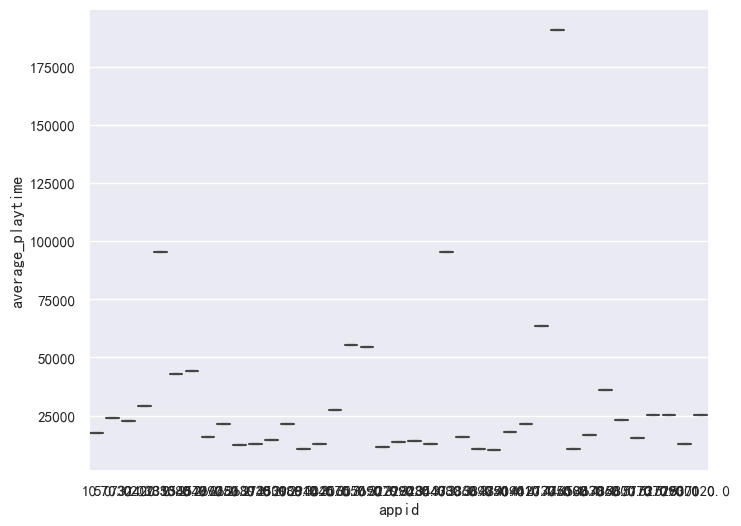

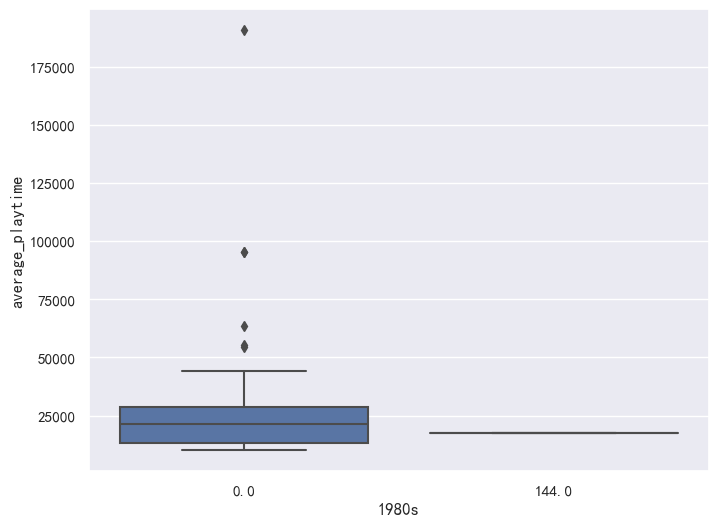

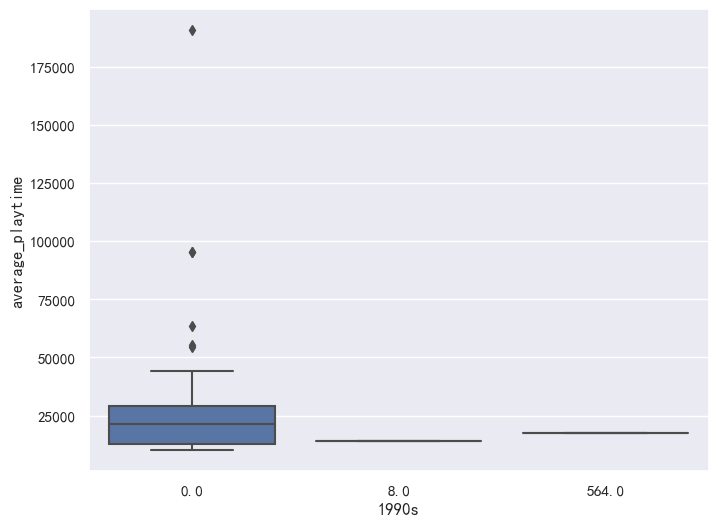

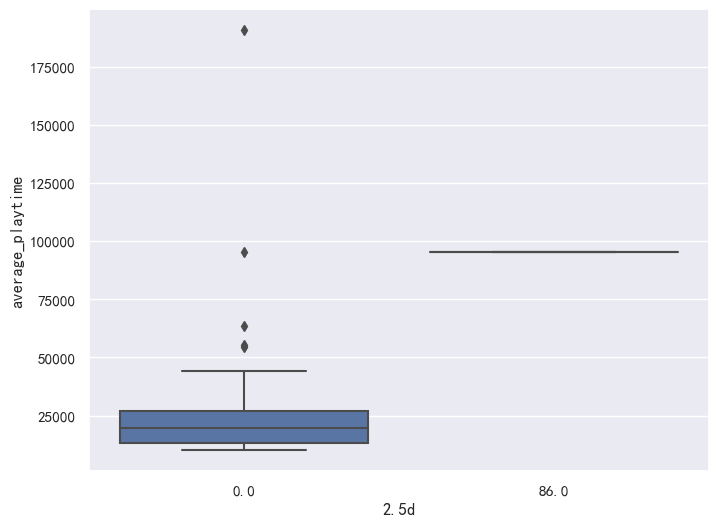

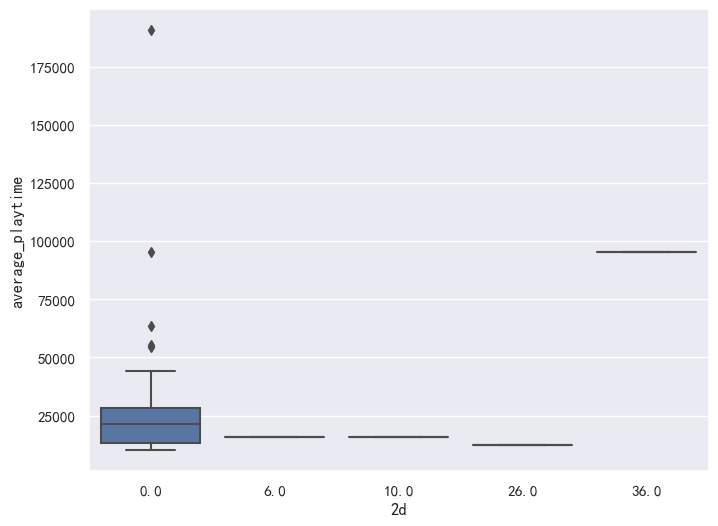

...

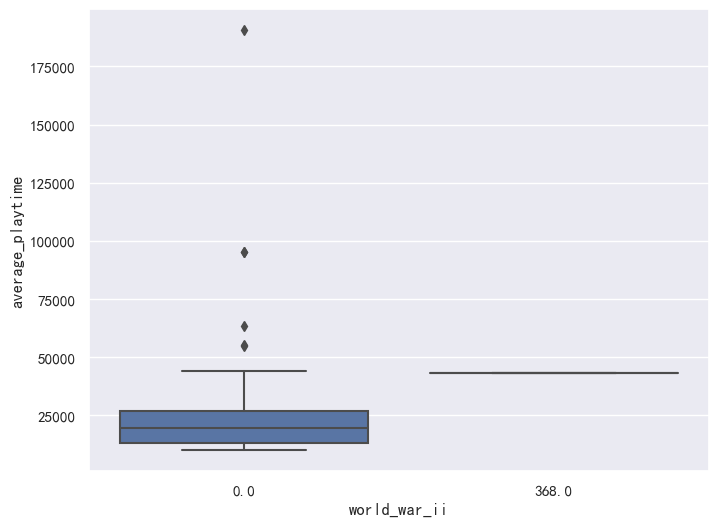

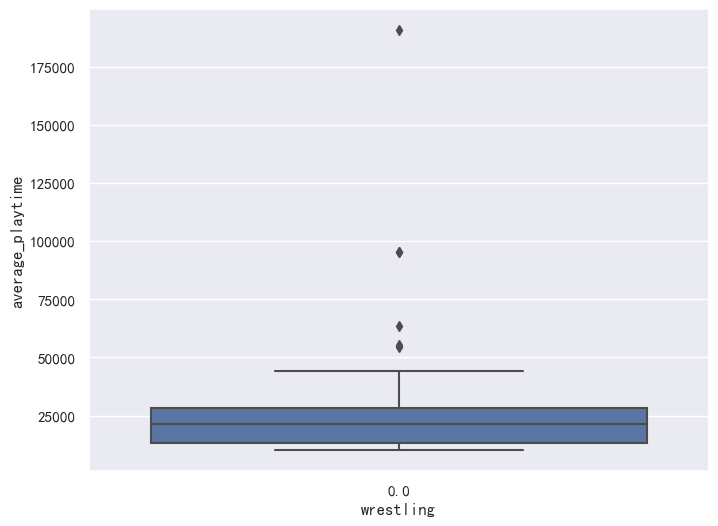

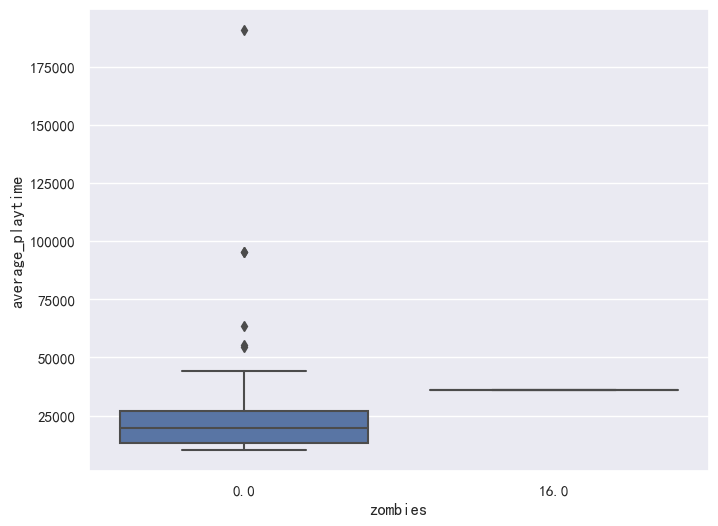

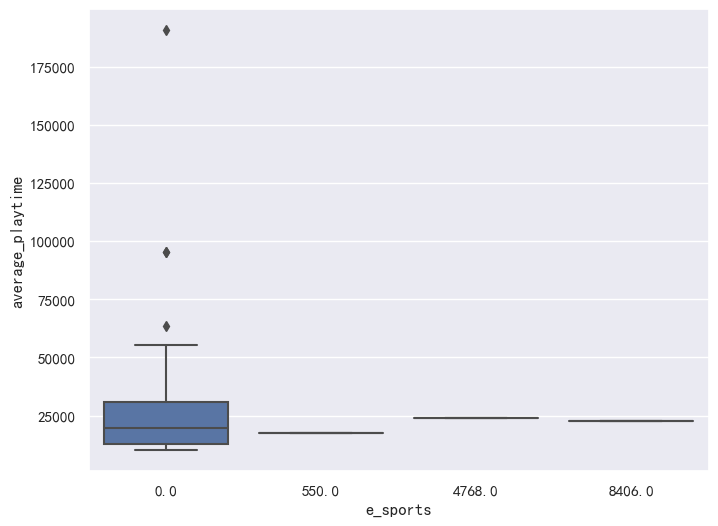

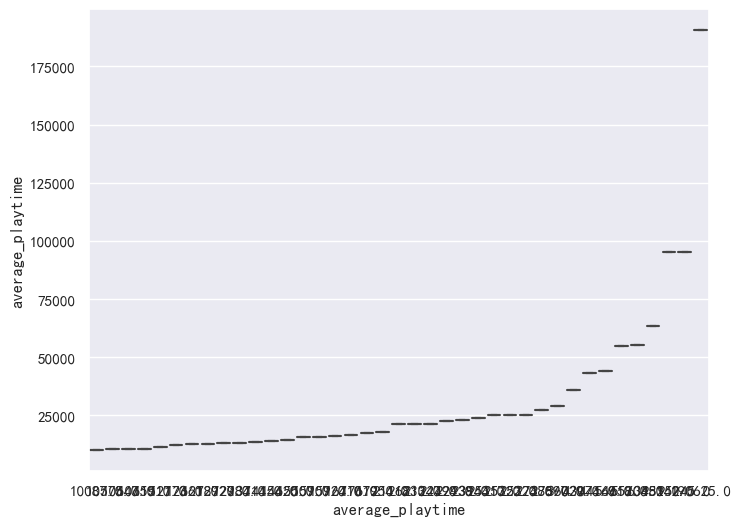

In [454]:
plt.rcParams['font.sans-serif']=['SimHei'] #Show Chinese label
plt.rcParams['axes.unicode_minus']=False   #These two lines need to be set manually

#i=0
for var in playtimeDF:
    # Box-plot of average playtime against each of the other variables
    f = plt.figure(figsize=(8, 6))
    sb.boxplot(x = var, y = 'average_playtime', data = playtimeDF)
    #i+=1
    #if i == 20:
        #break

check correlation table between steamspy tags.

In [455]:
steamspyCorr = steamspy.corr()
steamspyCorr

,appid,1980s,1990s,2.5d,2d,2d_fighter,360_video,3d,3d_platformer,3d_vision,...,web_publishing,werewolves,western,word_game,world_war_i,world_war_ii,wrestling,zombies,e_sports,average_playtime
appid,1.000000,-0.018539,-0.054340,-0.021786,-0.047408,-0.020983,0.009420,-0.005856,-0.020614,-0.043944,...,-0.008779,-0.016870,-0.024224,0.001029,-0.018018,-0.038373,-0.001849,-0.037349,-0.024860,-0.043170
1980s,-0.018539,1.000000,0.240587,-0.001517,0.053908,-0.001247,-0.000442,-0.001442,-0.001623,-0.001148,...,-0.000928,-0.000695,-0.000844,-0.000729,-0.000624,-0.001197,-0.000710,-0.001089,0.005674,0.004354
1990s,-0.054340,0.240587,1.000000,0.017327,0.020137,-0.001815,-0.000643,-0.002098,0.004285,-0.001670,...,-0.001350,-0.000550,-0.001228,-0.001061,-0.000872,-0.000150,-0.001034,-0.000605,0.036492,0.040058
2.5d,-0.021786,-0.001517,0.017327,1.000000,0.043916,0.192869,-0.000782,-0.000704,0.013342,0.004450,...,-0.001643,0.000552,-0.001365,-0.001291,-0.001105,-0.001712,-0.001258,0.000562,0.001555,0.057438
2d,-0.047408,0.053908,0.020137,0.043916,1.000000,0.083915,-0.001369,0.005620,0.001573,0.005419,...,0.003441,-0.000438,0.001002,0.003279,0.024733,-0.003553,0.001475,0.001652,-0.001098,0.001061
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
world_war_ii,-0.038373,-0.001197,-0.000150,-0.001712,-0.003553,-0.001743,-0.000617,0.000102,-0.002268,-0.001604,...,-0.001297,-0.000971,-0.001179,-0.001019,0.005923,1.000000,-0.000993,0.017826,-0.000557,0.011299
wrestling,-0.001849,-0.000710,-0.001034,-0.001258,0.001475,-0.001035,-0.000366,-0.001196,-0.001346,-0.000952,...,-0.000770,-0.000577,-0.000700,-0.000605,-0.000518,-0.000993,1.000000,-0.000945,-0.000331,-0.002221
zombies,-0.037349,-0.001089,-0.000605,0.000562,0.001652,-0.001520,-0.000588,-0.001919,-0.001948,0.010182,...,-0.001235,-0.000738,0.001200,0.000048,-0.000773,0.017826,-0.000945,1.000000,-0.000531,-0.000141
e_sports,-0.024860,0.005674,0.036492,0.001555,-0.001098,0.004207,-0.000206,-0.000634,-0.000638,-0.000409,...,-0.000432,-0.000324,-0.000359,-0.000340,-0.000291,-0.000557,-0.000331,-0.000531,1.000000,0.111420


In [456]:
'''
fig = ff.create_annotated_heatmap(
    z=steamspyCorr.values,
    x=list(steamspyCorr.columns),
    y=list(steamspyCorr.index),
    colorscale=px.colors.diverging.RdBu,
    annotation_text=steamspyCorr.round(2).values,
    showscale=True, reversescale=True)

for i in range(len(fig.layout.annotations)):
    fig.layout.annotations[i].font.size = 8

#plt.rcParams['figure.figsize'] = [100, 30]
fig.show()
'''

"\nfig = ff.create_annotated_heatmap(\n    z=steamspyCorr.values,\n    x=list(steamspyCorr.columns),\n    y=list(steamspyCorr.index),\n    colorscale=px.colors.diverging.RdBu,\n    annotation_text=steamspyCorr.round(2).values,\n    showscale=True, reversescale=True)\n\nfor i in range(len(fig.layout.annotations)):\n    fig.layout.annotations[i].font.size = 8\n\n#plt.rcParams['figure.figsize'] = [100, 30]\nfig.show()\n"

## Clustering

In [457]:
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as shc
from sklearn.metrics import silhouette_score
from scipy.spatial.distance import pdist
from scipy.spatial.distance import squareform
import networkx as nx
from ast import literal_eval
import plotly.express as px
import matplotlib.pyplot as plt
import numpy as np 
import pandas as pd 

In [458]:
tagDF2 = steamspy.copy()
tagDF2 = tagDF2.loc[:,tagDF2.max() > 4500]
tagDF2.info()
tagDF2.head()

<class 'pandas.core.frame.DataFrame'>
Index: 15288 entries, 0 to 28994
Data columns (total 57 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   appid                 15288 non-null  float64
 1   2d                    15288 non-null  float64
 2   action                15288 non-null  float64
 3   adventure             15288 non-null  float64
 4   atmospheric           15288 non-null  float64
 5   building              15288 non-null  float64
 6   choices_matter        15288 non-null  float64
 7   class_based           15288 non-null  float64
 8   co_op                 15288 non-null  float64
 9   comedy                15288 non-null  float64
 10  competitive           15288 non-null  float64
 11  crafting              15288 non-null  float64
 12  crime                 15288 non-null  float64
 13  dark_fantasy          15288 non-null  float64
 14  dinosaurs             15288 non-null  float64
 15  driving               15

,appid,2d,action,adventure,atmospheric,building,choices_matter,class_based,co_op,comedy,...,survival,tactical,team_based,third_person,third_person_shooter,trading,war,zombies,e_sports,average_playtime
0,10.0,0.0,2681.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,192.0,734.0,943.0,0.0,0.0,0.0,0.0,0.0,550.0,17612.0
1,20.0,0.0,208.0,15.0,0.0,0.0,0.0,124.0,62.0,0.0,...,0.0,0.0,115.0,0.0,0.0,0.0,0.0,0.0,0.0,277.0
2,30.0,0.0,99.0,0.0,0.0,0.0,0.0,55.0,12.0,0.0,...,0.0,14.0,79.0,0.0,0.0,0.0,80.0,0.0,0.0,187.0
3,40.0,0.0,85.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,258.0
4,50.0,0.0,211.0,87.0,73.0,0.0,0.0,0.0,27.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,624.0


In [459]:
'''
fig = ff.create_annotated_heatmap(
    z=tagDF2.values,
    x=list(tagDF2.columns),
    y=list(tagDF2.index),
    colorscale=px.colors.diverging.RdBu,
    annotation_text=tagDF2.round(2).values,
    showscale=True, reversescale=True)

for i in range(len(fig.layout.annotations)):
    fig.layout.annotations[i].font.size = 8

#plt.rcParams['figure.figsize'] = [100, 30]
fig.show()
'''

"\nfig = ff.create_annotated_heatmap(\n    z=tagDF2.values,\n    x=list(tagDF2.columns),\n    y=list(tagDF2.index),\n    colorscale=px.colors.diverging.RdBu,\n    annotation_text=tagDF2.round(2).values,\n    showscale=True, reversescale=True)\n\nfor i in range(len(fig.layout.annotations)):\n    fig.layout.annotations[i].font.size = 8\n\n#plt.rcParams['figure.figsize'] = [100, 30]\nfig.show()\n"

In [460]:
topTags = pd.DataFrame(tagDF2.apply(lambda x:list(tagDF2.columns[np.array(x).argsort()[::-1][:10]]), 
    axis=1).astype('string')
,  columns=['Top10'])

topTags = pd.concat([topTags, tagDF2[['appid']]], axis=1)
topTags.head()

,Top10,appid
0,"['average_playtime', 'action', 'fps', 'multipl...",10.0
1,"['average_playtime', 'action', 'fps', 'multipl...",20.0
2,"['average_playtime', 'fps', 'multiplayer', 'ac...",30.0
3,"['average_playtime', 'action', 'fps', 'multipl...",40.0
4,"['average_playtime', 'fps', 'action', 'singlep...",50.0


In [461]:
tagDF3 = tagDF2.T
tagDF3 = tagDF3.drop('appid')

pairwise = pd.DataFrame(
    squareform(pdist(tagDF3)),
    columns = tagDF3.index,
    index = tagDF3.index
)
pairwise.head()

,2d,action,adventure,atmospheric,building,choices_matter,class_based,co_op,comedy,competitive,...,survival,tactical,team_based,third_person,third_person_shooter,trading,war,zombies,e_sports,average_playtime
2d,0.000000,32013.346920,20695.291711,15321.851553,13044.986930,9354.670117,10065.380221,19902.216007,12874.450784,15617.750126,...,27331.920405,14931.003717,17693.209291,18252.132834,14385.259087,10041.032019,10878.375154,19083.291357,12561.179403,NaN
action,32013.346920,0.000000,23035.880838,25472.878911,31433.324021,32752.014991,30968.780215,18930.589875,27823.238920,27551.879319,...,33729.129784,27483.568054,26416.609396,24851.168383,26420.122369,29675.316089,29776.976123,31477.458474,29066.877352,NaN
adventure,20695.291711,23035.880838,0.000000,13175.853369,19235.059735,22011.615388,22276.900592,17857.353415,19350.318602,25276.235954,...,23447.215229,24570.898376,26384.906860,17078.471770,19062.036932,22262.752952,22495.999089,22089.917112,23510.937136,NaN
atmospheric,15321.851553,25472.878911,13175.853369,0.000000,18384.532058,14968.814783,15526.216474,18373.692688,14800.474925,19518.788436,...,26638.606082,18665.963650,21067.923343,11212.163395,12811.791054,15513.282019,15846.327240,19454.688330,17247.556204,NaN
building,13044.986930,31433.324021,19235.059735,18384.532058,0.000000,15976.724414,14768.401166,18922.084452,15283.142118,19013.179140,...,24091.936763,18448.101366,20732.353195,21072.972382,17884.884931,14756.230142,15368.268673,21481.821035,16575.442317,NaN


In [462]:
fig = px.imshow(pairwise.values, x=pairwise.columns, y=pairwise.index, color_continuous_scale='Viridis', aspect="auto")
fig.update_layout(
    autosize=True,
    width=1000,
    height=800,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=2
    ),
    paper_bgcolor="LightBlue",
)
fig.show()

In [463]:
pairwise2 = pd.DataFrame(
    squareform(pdist(tagDF3, metric='cosine')),
    columns = tagDF3.index,
    index = tagDF3.index
)

fig = px.imshow(pairwise2.values, x=pairwise2.columns, y=pairwise2.index, color_continuous_scale='viridis', aspect="auto")
fig.update_layout(
    autosize=True,
    width=1000,
    height=800,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=2
    ),
    paper_bgcolor="LightBlue",
)
fig.show()

In [464]:
# condense the distance matrix
condensedPairwise = squareform(pairwise2)
# getting labels for the dendrogram from the dataframe index
labels = list(tagDF3.index.values)

plt.figure(figsize =(15, 10))
plt.title('Hierarchal Dendrogram with Ward linkage')
Dendrogram = shc.dendrogram((shc.linkage(condensedPairwise, method ='ward')), labels=labels, leaf_font_size=12.)

# threshold for dendrogram cut
cut = 1.5
plt.axhline(y=cut, c='k')

ValueError: Distance matrix 'X' must be symmetric.

In [ ]:
topTags['Top10'] = topTags['Top10'].apply(literal_eval)

cluster1 = ['strategy', 'free_to_play', 'moba', 'class_based', 'trading', 'military', 'war', 'online_co_op',
        'tactical', 'fps', 'shooter', 'pvp', 'e_sports', 'competitive', 'team_based']
cluster2 = ['dark_fantasy', 'fantasy', 'rpg', '2d', 'pixel_graphics', 'choices_matter', 'multiple_endings',
        'great_soundtrack', 'story_rich']
cluster3 = ['mod', 'physics', 'moddable', 'comedy', 'funny', 'horror', 'psychological_horror', 'heist',
        'driving', 'simulation']
cluster4 = ['third_person_shooter', 'crime', 'racing', 'mature', 'third_person']
cluster5 = ['dinosaurs', 'crafting', 'survival', 'building', 'sandbox', 'post_apocalyptic', 'zombies',
        'co_op', 'multiplayer', 'action', 'first_person', 'exploration', 'adventure', 'open_world',
        'atmospheric', 'singleplayer']


tagsDict = topTags.to_dict('records')
# print(type(tagsDict[1]['Top10']))

for row in tagsDict:
    tempTags = row['Top10']
    tempL = []

    tempL.append(len(set(tempTags).intersection(cluster1)))
    tempL.append(len(set(tempTags).intersection(cluster2)))
    tempL.append(len(set(tempTags).intersection(cluster3)))
    tempL.append(len(set(tempTags).intersection(cluster4)))
    tempL.append(len(set(tempTags).intersection(cluster5)))
    
    maxV = __builtin__.max(tempL)
    maxIndex = tempL.index(maxV)
    row['cluster'] = "cluster_{}".format(maxIndex+1)
    tempL.clear()

tagsDict = pd.DataFrame.from_records(tagsDict)

gameDF = pd.merge(left=gameDF, right=tagsDict, left_on='Unnamed: 0', right_on='appid')
gameDF.head()

In [ ]:
gameDF.to_csv('dataset/steam_cleaned_cluster.csv')